In [1]:
import geopy
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import LinearSVR
from sklearn.pipeline import make_pipeline
from sklearn import tree
import matplotlib.pyplot as plt
import lime
from lime import lime_tabular
import random
from sklearn import linear_model

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation
from tensorflow.keras.optimizers import Adam

In [2]:
ams_1 = pd.read_json('Amsterdam_1(2771).json', dtype =False)

In [3]:
ams_1.head()

,year_built,area,url,price,bedrooms,postal_code,rooms,address,property_type
0,1984,31,http://www.funda.nl/koop/amsterdam/appartement...,132.500,1,1065 LX,1,Jan Muschstraat 8,apartment
1,1990,79,http://www.funda.nl/koop/amsterdam/appartement...,300.000,1,1019 HT,2,Zeeburgerkade 738 +PP,apartment
2,1906,93,http://www.funda.nl/koop/amsterdam/appartement...,550.000,3,1051 GT,4,Cliffordstraat 22 -HUIS,apartment
3,2002,90,http://www.funda.nl/koop/amsterdam/appartement...,318.500,2,1095 LG,3,Zeeburgerdijk 768,apartment
4,1904,142,http://www.funda.nl/koop/amsterdam/huis-497973...,475.000,3,1035 PS,6,Landsmeerderdijk 47,house


In [4]:
ams_1.shape

(2769, 9)

In [5]:
ams_1.dtypes

year_built       object
area             object
url              object
price            object
bedrooms         object
postal_code      object
rooms            object
address          object
property_type    object
dtype: object

In [6]:
ams_1["price"] = ams_1["price"].astype(str)

In [7]:
ams_1["len"] = ams_1["price"].apply(lambda x: len(x))

In [8]:
ams_1[ams_1["len"] == 5][:5]

,year_built,area,url,price,bedrooms,postal_code,rooms,address,property_type,len
9,2004,249,http://www.funda.nl/koop/amsterdam/huis-498833...,1.175,4,1087 KA,6,Lisdoddelaan 58,house,5
15,1800,205,http://www.funda.nl/koop/amsterdam/appartement...,1.675,4,1017 JD,6,Amstelveld 7 Bov,apartment,5
32,2016,168,http://www.funda.nl/koop/amsterdam/huis-498740...,1.198,5,1087 SE,6,Dennenhof 1,house,5
44,2012,161,http://www.funda.nl/koop/amsterdam/appartement...,1.000,3,1031 KC,4,Overhoeksparklaan 68 + PP,apartment,5
49,1920,178,http://www.funda.nl/koop/amsterdam/appartement...,1.075,3,1017 KT,4,Prinsengracht 612 E-hs,apartment,5


In [9]:
ams_1["price"] = ams_1["price"].apply(lambda x: x + "000" if len(x) ==5 else x)

In [11]:
ams_1["price"] = ams_1["price"].apply(lambda x: x + "0" if len(x) ==6 else x)

In [12]:
ams_1["price"][60] = ams_1["price"][60] + "0"

C:\Users\TL\AppData\Local\Temp/ipykernel_2744/574544986.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ams_1["price"][60] = ams_1["price"][60] + "0"


In [13]:
ams_1["price"][132] = ams_1["price"][132] + "0"

C:\Users\TL\AppData\Local\Temp/ipykernel_2744/61898818.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ams_1["price"][132] = ams_1["price"][132] + "0"


In [14]:
ams_1["price"][1492] = ams_1["price"][1492] + "0"

C:\Users\TL\AppData\Local\Temp/ipykernel_2744/1854686871.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ams_1["price"][1492] = ams_1["price"][1492] + "0"


In [15]:
ams_1["price"][1816] = ams_1["price"][1816] + "0"

C:\Users\TL\AppData\Local\Temp/ipykernel_2744/3280957497.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ams_1["price"][1816] = ams_1["price"][1816] + "0"


In [16]:
ams_1[ams_1["len"]==6]

,year_built,area,url,price,bedrooms,postal_code,rooms,address,property_type,len
39,1985,43,http://www.funda.nl/koop/amsterdam/appartement...,95.0000,1,1104 MN,2,Kloekhorststraat 207,apartment,6
60,1899,572,http://www.funda.nl/koop/amsterdam/huis-498757...,11.75000,8,1071 GK,16,Van Eeghenstraat 80 *,house,6
132,1899,572,http://www.funda.nl/koop/amsterdam/huis-498758...,11.75000,6,1071 GK,16,Van Eeghenstraat 80,house,6
303,1985,29,http://www.funda.nl/koop/amsterdam/appartement...,95.0000,1,1102 ZK,1,Daniël Defoelaan 74,apartment,6
492,1984,29,http://www.funda.nl/koop/amsterdam/appartement...,87.5000,1,1102 WZ,2,Dalsteindreef 312,apartment,6
1108,1984,45,http://www.funda.nl/koop/amsterdam/appartement...,99.9000,1,1104 MK,2,Kloekhorststraat 57,apartment,6
1492,2017,1,http://www.funda.nl/koop/amsterdam/appartement...,24.50000,7,1012 JS,15,Dam 3 D,apartment,6
1791,1968,28,http://www.funda.nl/koop/amsterdam/appartement...,99.0000,1,1025 ZX,1,Amerbos 396,apartment,6
1816,1687,1,http://www.funda.nl/koop/amsterdam/huis-498768...,14.95000,18,1017 CC,37,Herengracht 518 + Keizersgracht 633 + P,house,6
1907,1974,55,http://www.funda.nl/koop/amsterdam/appartement...,95.0000,1,1103 KZ,2,Gouden Leeuw 1022,apartment,6


In [17]:
ams_1["price"] = ams_1["price"].apply(lambda x:x.replace(".",""))

In [18]:
ams_1[ams_1["len"] == 5][:5]

,year_built,area,url,price,bedrooms,postal_code,rooms,address,property_type,len
9,2004,249,http://www.funda.nl/koop/amsterdam/huis-498833...,1175000,4,1087 KA,6,Lisdoddelaan 58,house,5
15,1800,205,http://www.funda.nl/koop/amsterdam/appartement...,1675000,4,1017 JD,6,Amstelveld 7 Bov,apartment,5
32,2016,168,http://www.funda.nl/koop/amsterdam/huis-498740...,1198000,5,1087 SE,6,Dennenhof 1,house,5
44,2012,161,http://www.funda.nl/koop/amsterdam/appartement...,1000000,3,1031 KC,4,Overhoeksparklaan 68 + PP,apartment,5
49,1920,178,http://www.funda.nl/koop/amsterdam/appartement...,1075000,3,1017 KT,4,Prinsengracht 612 E-hs,apartment,5


In [38]:
ams_1["price"] = ams_1["price"].astype(int)

In [39]:
ams_1.head()

,year_built,area,url,price,bedrooms,postal_code,rooms,address,property_type,len
0,1984,31,http://www.funda.nl/koop/amsterdam/appartement...,132500,1,1065 LX,1,Jan Muschstraat 8,apartment,7
1,1990,79,http://www.funda.nl/koop/amsterdam/appartement...,300000,1,1019 HT,2,Zeeburgerkade 738 +PP,apartment,7
2,1906,93,http://www.funda.nl/koop/amsterdam/appartement...,550000,3,1051 GT,4,Cliffordstraat 22 -HUIS,apartment,7
3,2002,90,http://www.funda.nl/koop/amsterdam/appartement...,318500,2,1095 LG,3,Zeeburgerdijk 768,apartment,7
4,1904,142,http://www.funda.nl/koop/amsterdam/huis-497973...,475000,3,1035 PS,6,Landsmeerderdijk 47,house,7


In [40]:
ams_2 = pd.read_json('Amsterdam_2(2770).json')

In [41]:
ams_2 = ams_2.drop("city", axis = 1)

In [42]:
ams_2.shape

(2768, 9)

In [43]:
ams_2["price"] = ams_2["price"].astype(str)

In [44]:
ams_2["len"] = ams_2["price"].apply(lambda x: len(x))

In [45]:
ams_2.head()

,year_built,area,url,price,bedrooms,postal_code,rooms,address,property_type,len
0,1720,88,http://www.funda.nl/koop/amsterdam/appartement...,425000,2,1018 MR,3,Oostenburgervoorstraat 246,apartment,6
1,1904,142,http://www.funda.nl/koop/amsterdam/huis-497973...,475000,3,1035 PS,6,Landsmeerderdijk 47,house,6
2,1995,88,http://www.funda.nl/koop/amsterdam/appartement...,469000,2,1019 LG,3,KNSM-laan 519,apartment,6
3,1956,69,http://www.funda.nl/koop/amsterdam/appartement...,200000,3,1065 TP,4,Ariana Nozemanstraat 5 II,apartment,6
4,1984,72,http://www.funda.nl/koop/amsterdam/appartement...,125000,2,1104 PA,3,Kolfschotenstraat 56,apartment,6


In [46]:
ams_2["price"] = ams_2["price"].apply(lambda x: x + "0" if len(x) ==5 else x)

In [47]:
ams_2["price"] = ams_2["price"].apply(lambda x: x + "000" if len(x) ==4 else x)

In [48]:
ams_2["price"][39] = ams_2["price"][39] + "0"

C:\Users\TL\AppData\Local\Temp/ipykernel_11244/882002153.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ams_2["price"][39] = ams_2["price"][39] + "0"


In [49]:
ams_2["price"][151] = ams_2["price"][151] + "0"

C:\Users\TL\AppData\Local\Temp/ipykernel_11244/3923837466.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ams_2["price"][151] = ams_2["price"][151] + "0"


In [50]:
ams_2["price"][1515] = ams_2["price"][1515] + "0"

C:\Users\TL\AppData\Local\Temp/ipykernel_11244/3325377163.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ams_2["price"][1515] = ams_2["price"][1515] + "0"


In [51]:
ams_2["price"][1776] = ams_2["price"][1776] + "0"

C:\Users\TL\AppData\Local\Temp/ipykernel_11244/1399415967.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ams_2["price"][1776] = ams_2["price"][1776] + "0"


In [52]:
ams_2["price"] = ams_2["price"].astype(int)

In [53]:
ams_3 = pd.read_json("Amsterdam_3(2770).json")

In [54]:
ams_3 = ams_3.drop(["sale_date", "posting_date"], axis=1)

In [55]:
ams_3.head()

,year_built,area,url,price,bedrooms,postal_code,rooms,address,property_type
0,1906,108,http://www.funda.nl/koop/verkocht/amsterdam/ap...,510000,2,1013 TN,3,Knollendamstraat 4 III/IV,apartment
1,1938,47,http://www.funda.nl/koop/verkocht/amsterdam/ap...,215000,1,1079 XM,2,Moerdijkstraat 47 1,apartment
2,2003,116,http://www.funda.nl/koop/verkocht/amsterdam/ap...,325000,2,1095 AD,3,Zeeburgerdijk 349,apartment
3,1910,58,http://www.funda.nl/koop/verkocht/amsterdam/ap...,315000,2,1054 VH,3,Brederodestraat 124 -1,apartment
4,1906,63,http://www.funda.nl/koop/verkocht/amsterdam/ap...,200000,1,1055 MD,3,Admiraal De Ruijterweg 409 III,apartment


In [56]:
ams_3.shape

(11443, 9)

In [57]:
ams_3["price"] = ams_3["price"].astype(str)

In [58]:
ams_3["len"] = ams_3["price"].apply(lambda x: len(x))

In [59]:
ams_3[ams_3["len"]==6]

,year_built,area,url,price,bedrooms,postal_code,rooms,address,property_type,len
0,1906,108,http://www.funda.nl/koop/verkocht/amsterdam/ap...,510000,2,1013 TN,3,Knollendamstraat 4 III/IV,apartment,6
1,1938,47,http://www.funda.nl/koop/verkocht/amsterdam/ap...,215000,1,1079 XM,2,Moerdijkstraat 47 1,apartment,6
2,2003,116,http://www.funda.nl/koop/verkocht/amsterdam/ap...,325000,2,1095 AD,3,Zeeburgerdijk 349,apartment,6
3,1910,58,http://www.funda.nl/koop/verkocht/amsterdam/ap...,315000,2,1054 VH,3,Brederodestraat 124 -1,apartment,6
4,1906,63,http://www.funda.nl/koop/verkocht/amsterdam/ap...,200000,1,1055 MD,3,Admiraal De Ruijterweg 409 III,apartment,6
...,...,...,...,...,...,...,...,...,...,...
11438,1938,113,http://www.funda.nl/koop/verkocht/amsterdam/ap...,599000,3,1077 CS,5,Olympiaplein 83 -III,apartment,6
11439,1993,88,http://www.funda.nl/koop/verkocht/amsterdam/ap...,399000,2,1015 NH,3,Anjeliersstraat 20,apartment,6
11440,1906,77,http://www.funda.nl/koop/verkocht/amsterdam/ap...,399000,2,1072 GV,4,Rustenburgerstraat 389 I,apartment,6
11441,1931,90,http://www.funda.nl/koop/verkocht/amsterdam/ap...,259000,3,1055 NX,4,Doggersbankstraat 12 II,apartment,6


In [60]:
ams_3["price"] = ams_3["price"].apply(lambda x: x + "000" if len(x) ==4 else x)

In [61]:
ams_3["price"] = ams_3["price"].apply(lambda x: x + "0" if len(x) ==5 else x)

In [62]:
ams_3["price"] = ams_3["price"].astype(int)

In [63]:
df = pd.concat([ams_1,ams_2,ams_3], ignore_index=True)

In [64]:
df.shape

(16980, 10)

In [65]:
df.head()

,year_built,area,url,price,bedrooms,postal_code,rooms,address,property_type,len
0,1984,31,http://www.funda.nl/koop/amsterdam/appartement...,132500,1,1065 LX,1,Jan Muschstraat 8,apartment,7
1,1990,79,http://www.funda.nl/koop/amsterdam/appartement...,300000,1,1019 HT,2,Zeeburgerkade 738 +PP,apartment,7
2,1906,93,http://www.funda.nl/koop/amsterdam/appartement...,550000,3,1051 GT,4,Cliffordstraat 22 -HUIS,apartment,7
3,2002,90,http://www.funda.nl/koop/amsterdam/appartement...,318500,2,1095 LG,3,Zeeburgerdijk 768,apartment,7
4,1904,142,http://www.funda.nl/koop/amsterdam/huis-497973...,475000,3,1035 PS,6,Landsmeerderdijk 47,house,7


In [66]:
df.dtypes

year_built       object
area             object
url              object
price             int32
bedrooms         object
postal_code      object
rooms            object
address          object
property_type    object
len               int64
dtype: object

In [67]:
df["property_type"].value_counts()

apartment    14406
house         2574
Name: property_type, dtype: int64

In [68]:
df = df.drop(["url", "len"], axis = 1)

In [69]:
df["year_built"].value_counts()

1906    2374
1931     433
1930     374
1960     352
1906     290
        ... 
1865       1
1618       1
1621       1
1872       1
1715       1
Name: year_built, Length: 415, dtype: int64

In [70]:
df["year_built"]=df["year_built"].astype(int)

In [71]:
sorted(list(df["year_built"]))

[1005,
 1076,
 1530,
 1600,
 1600,
 1600,
 1600,
 1600,
 1600,
 1600,
 1600,
 1602,
 1602,
 1615,
 1615,
 1615,
 1615,
 1615,
 1615,
 1615,
 1615,
 1615,
 1615,
 1615,
 1615,
 1615,
 1615,
 1617,
 1617,
 1618,
 1618,
 1620,
 1620,
 1620,
 1620,
 1620,
 1620,
 1620,
 1621,
 1621,
 1621,
 1622,
 1622,
 1625,
 1625,
 1625,
 1625,
 1625,
 1628,
 1629,
 1630,
 1630,
 1635,
 1640,
 1640,
 1640,
 1640,
 1640,
 1640,
 1640,
 1640,
 1641,
 1641,
 1641,
 1641,
 1642,
 1642,
 1642,
 1645,
 1647,
 1647,
 1647,
 1648,
 1648,
 1650,
 1650,
 1650,
 1650,
 1650,
 1650,
 1650,
 1650,
 1650,
 1650,
 1654,
 1654,
 1655,
 1655,
 1660,
 1662,
 1663,
 1663,
 1664,
 1665,
 1665,
 1670,
 1670,
 1670,
 1670,
 1670,
 1672,
 1672,
 1672,
 1672,
 1675,
 1675,
 1680,
 1680,
 1680,
 1683,
 1683,
 1683,
 1685,
 1685,
 1685,
 1686,
 1686,
 1686,
 1687,
 1687,
 1688,
 1688,
 1690,
 1690,
 1690,
 1690,
 1690,
 1690,
 1690,
 1690,
 1693,
 1695,
 1695,
 1695,
 1695,
 1697,
 1700,
 1700,
 1700,
 1700,
 1700,
 1700,
 1700,

In [72]:
df.isna().sum()

year_built       0
area             0
price            0
bedrooms         0
postal_code      0
rooms            0
address          0
property_type    0
dtype: int64

In [73]:
#Encode "property_Type"
df["property_type"] = df["property_type"].apply(lambda x: 0 if x == "house" else 1)

In [74]:
df.dtypes

year_built        int32
area             object
price             int32
bedrooms         object
postal_code      object
rooms            object
address          object
property_type     int64
dtype: object

In [75]:
df[["year_built", "area", "bedrooms","rooms"]] = df[["year_built", "area", "bedrooms","rooms"]].astype(int)

In [152]:
# #Encode year_built:
# le = LabelEncoder()
# df["year_built"] = le.fit_transform(df["year_built"])

In [153]:
#df = df.drop_duplicates(subset = ["address", "postal_code", "property_type"])

In [76]:
df["postal_code"] = df["postal_code"].apply(lambda x: x.replace(" ", ""))

In [77]:
df.dtypes

year_built        int32
area              int32
price             int32
bedrooms          int32
postal_code      object
rooms             int32
address          object
property_type     int64
dtype: object

In [55]:
df = df.reset_index()

In [56]:
df.head()

,index,year_built,area,price,bedrooms,postal_code,rooms,address,property_type
0,0,1984,31,132500,1,1065LX,1,Jan Muschstraat 8,1
1,1,1990,79,300000,1,1019HT,2,Zeeburgerkade 738 +PP,1
2,2,1906,93,550000,3,1051GT,4,Cliffordstraat 22 -HUIS,1
3,3,2002,90,318500,2,1095LG,3,Zeeburgerdijk 768,1
4,4,1904,142,475000,3,1035PS,6,Landsmeerderdijk 47,0


In [57]:
df.shape

(16980, 9)

In [58]:
df["postal_code"] = df["postal_code"].astype(str)

In [59]:
df = df.drop(["index"], axis = 1)

In [60]:
df["postal_code"][8239] = "1064EK"

C:\Users\TL\AppData\Local\Temp/ipykernel_12228/1090145124.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["postal_code"][8239] = "1064EK"


In [104]:
df = df.drop(["year_built"], axis = 1)

In [125]:
df.head()

,year_built,area,price,bedrooms,postal_code,rooms,address,property_type
0,1984,31,132500,1,1065LX,1,Jan Muschstraat 8,1
1,1990,79,300000,1,1019HT,2,Zeeburgerkade 738 +PP,1
2,1906,93,550000,3,1051GT,4,Cliffordstraat 22 -HUIS,1
3,2002,90,318500,2,1095LG,3,Zeeburgerdijk 768,1
4,1904,142,475000,3,1035PS,6,Landsmeerderdijk 47,0


In [61]:
df["postal_code"][11130] = "1064EK"

C:\Users\TL\AppData\Local\Temp/ipykernel_12228/2118735172.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["postal_code"][11130] = "1064EK"


In [64]:
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="myGeocoder")

In [93]:
start = 16901
for i in range(17000,17100,100):
    df_tmp = df.loc[start:i]
    df_tmp["longitude"] = df_tmp["postal_code"].apply(lambda x: geolocator.geocode(x).longitude)
    df_tmp["latitude"] = df_tmp["postal_code"].apply(lambda x: geolocator.geocode(x).latitude)
    df_tmp.to_csv("./csv_update/df_{}.csv".format(i))
    start=i+1

C:\Users\TL\AppData\Local\Temp/ipykernel_19348/3361444097.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tmp["longitude"] = df_tmp["postal_code"].apply(lambda x: geolocator.geocode(x).longitude)
C:\Users\TL\AppData\Local\Temp/ipykernel_19348/3361444097.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tmp["latitude"] = df_tmp["postal_code"].apply(lambda x: geolocator.geocode(x).latitude)


In [74]:
# start = 10001
# for i in range(10100,14100,100):
#     df_tmp = df.loc[start:i]
#     df_tmp["longitude"] = df_tmp["postal_code"].apply(lambda x: geolocator.geocode(x).longitude)
#     df_tmp["latitude"] = df_tmp["postal_code"].apply(lambda x: geolocator.geocode(x).latitude)
#     df_tmp.to_csv("./csv_update/df_{}.csv".format(i))
#     start=i+1

C:\Users\TL\AppData\Local\Temp/ipykernel_12072/3011724597.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tmp["longitude"] = df_tmp["postal_code"].apply(lambda x: geolocator.geocode(x).longitude)
C:\Users\TL\AppData\Local\Temp/ipykernel_12072/3011724597.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tmp["latitude"] = df_tmp["postal_code"].apply(lambda x: geolocator.geocode(x).latitude)


In [163]:
# start = 8201
# for i in range(8300,10001,100):
#     df_tmp = df.loc[start:i]
#     df_tmp["longitude"] = df_tmp["postal_code"].apply(lambda x: geolocator.geocode(x).longitude)
#     df_tmp["latitude"] = df_tmp["postal_code"].apply(lambda x: geolocator.geocode(x).latitude)
#     df_tmp.to_csv("./csv/df_{}.csv".format(i))
#     start=i+1

In [75]:
# start = 10001
# for i in range(10100,14100,100):
#     print(start,i)
#     start=i+1

In [2]:
import glob

final = pd.DataFrame()
path = "C:/Users/TL/Desktop/Thesis/data/csv_update"
for file_name in glob.glob(path +'\*.csv'):
    x = pd.read_csv(file_name, low_memory=False)
    final = pd.concat([final,x],axis=0)

In [3]:
final.head()

,Unnamed: 0,area,price,bedrooms,postal_code,rooms,address,property_type,longitude,latitude
0,0,31,132500,1,1065LX,1,Jan Muschstraat 8,1,4.820961,52.356758
1,1,79,300000,1,1019HT,2,Zeeburgerkade 738 +PP,1,4.945214,52.369159
2,2,93,550000,3,1051GT,4,Cliffordstraat 22 -HUIS,1,4.872719,52.384031
3,3,90,318500,2,1095LG,3,Zeeburgerdijk 768,1,4.948301,52.366209
4,4,142,475000,3,1035PS,6,Landsmeerderdijk 47,0,4.899152,52.415561


In [4]:
final.shape

(16980, 10)

In [5]:
final.dtypes

Unnamed: 0         int64
area               int64
price              int64
bedrooms           int64
postal_code       object
rooms              int64
address           object
property_type      int64
longitude        float64
latitude         float64
dtype: object

In [6]:
final = final.reset_index()

In [7]:
final[final["area"]==1]

,index,Unnamed: 0,area,price,bedrooms,postal_code,rooms,address,property_type,longitude,latitude
2928,27,12428,1,1250000,7,1083AD,11,Europaboulevard 59,0,4.890094,52.331350
5692,91,1492,1,2450000,7,1012JS,15,Dam 3 D,1,4.894014,52.372917
8084,4,1805,1,9500000,11,1017CC,23,Herengracht 518,0,4.895013,52.364653
8095,15,1816,1,1495000,18,1017CC,37,Herengracht 518 + Keizersgracht 633 + P,0,4.895013,52.364653
10863,83,4284,1,2450000,7,1012JS,15,Dam 3 D,1,4.894014,52.372917
11120,40,4541,1,9500000,11,1017CC,23,Herengracht 518,0,4.895013,52.364653
11124,44,4545,1,1495000,18,1017CC,37,Herengracht 518 + Keizersgracht 633 + P,0,4.895013,52.364653


In [8]:
final["area"][2928:2929] = 997

C:\Users\TL\AppData\Local\Temp/ipykernel_10996/2102092827.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final["area"][2928:2929] = 997


In [9]:
final["area"][5692:5693] = 305

C:\Users\TL\AppData\Local\Temp/ipykernel_10996/4084769802.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final["area"][5692:5693] = 305


In [10]:
final["area"][10863:10864] = 305

C:\Users\TL\AppData\Local\Temp/ipykernel_10996/3069189987.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final["area"][10863:10864] = 305


In [11]:
final["area"][8084:8085] = 288

C:\Users\TL\AppData\Local\Temp/ipykernel_10996/907826926.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final["area"][8084:8085] = 288


In [12]:
final["area"][11120:11121] = 288

C:\Users\TL\AppData\Local\Temp/ipykernel_10996/2356253475.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final["area"][11120:11121] = 288


In [13]:
final["area"][8095:8096] = 224

C:\Users\TL\AppData\Local\Temp/ipykernel_10996/3595652390.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final["area"][8095:8096] = 224


In [14]:
final["area"][11124:11125] = 224

C:\Users\TL\AppData\Local\Temp/ipykernel_10996/631274933.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final["area"][11124:11125] = 224


In [15]:
final[final["area"]==1]

,index,Unnamed: 0,area,price,bedrooms,postal_code,rooms,address,property_type,longitude,latitude


In [16]:
final.head()

,index,Unnamed: 0,area,price,bedrooms,postal_code,rooms,address,property_type,longitude,latitude
0,0,0,31,132500,1,1065LX,1,Jan Muschstraat 8,1,4.820961,52.356758
1,1,1,79,300000,1,1019HT,2,Zeeburgerkade 738 +PP,1,4.945214,52.369159
2,2,2,93,550000,3,1051GT,4,Cliffordstraat 22 -HUIS,1,4.872719,52.384031
3,3,3,90,318500,2,1095LG,3,Zeeburgerdijk 768,1,4.948301,52.366209
4,4,4,142,475000,3,1035PS,6,Landsmeerderdijk 47,0,4.899152,52.415561


In [17]:
final= final.drop(["index", "Unnamed: 0", "postal_code", "address"], axis = 1)

In [18]:
final.shape

(16980, 7)

In [19]:
final.head()

,area,price,bedrooms,rooms,property_type,longitude,latitude
0,31,132500,1,1,1,4.820961,52.356758
1,79,300000,1,2,1,4.945214,52.369159
2,93,550000,3,4,1,4.872719,52.384031
3,90,318500,2,3,1,4.948301,52.366209
4,142,475000,3,6,0,4.899152,52.415561


In [20]:
final.describe()[1:].to_excel("describe.xlsx")

In [21]:
final.skew(axis=0, skipna=True)

area             3.570078
price            6.493520
bedrooms         1.814511
rooms            3.379361
property_type   -1.943214
longitude        0.163518
latitude        -0.296924
dtype: float64

<AxesSubplot:xlabel='index', ylabel='price'>

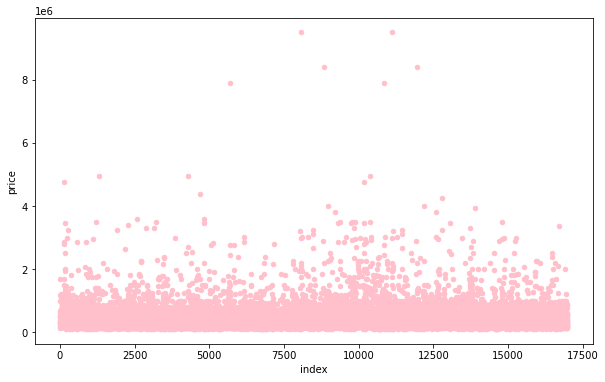

In [22]:
final.reset_index().plot(kind='scatter', x='index', y='price', color = "pink", figsize = (10,6))

In [23]:
#final = final.drop(["index"], axis = 1)

In [23]:
final.head()

,area,price,bedrooms,rooms,property_type,longitude,latitude
0,31,132500,1,1,1,4.820961,52.356758
1,79,300000,1,2,1,4.945214,52.369159
2,93,550000,3,4,1,4.872719,52.384031
3,90,318500,2,3,1,4.948301,52.366209
4,142,475000,3,6,0,4.899152,52.415561


In [24]:
X = final
y = final.pop("price")

In [25]:
#log-transform data:
from sklearn.preprocessing import FunctionTransformer
transformer = FunctionTransformer(np.log1p)
X = transformer.transform(X)
y = transformer.transform(y)

In [26]:
#Spliting Train-test sets:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8,test_size=0.2, random_state=666)

In [27]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, train_size=0.8,test_size=0.2, random_state=666)

In [28]:
#Standardizatin:
scaler = StandardScaler()
scaler.fit(X_train)
scaler.fit(X_val)
scaler.fit(X_test)
X_train = scaler.transform(X_train)
X_val = scaler.transform(X_val)
X_test= scaler.transform(X_test)

X_train = pd.DataFrame(X_train)
X_val = pd.DataFrame(X_val)
X_test = pd.DataFrame(X_test)

## Linear Part:

In [29]:
# Linear Regression:
LR = LinearRegression()
LR = LR.fit(X_train, y_train)
LR_pred = LR.predict(X_test)

In [30]:
LR_pred[0]

14.325208512529608

In [31]:
#MAE & R2 - Linear - train set:
print("mae:", mean_absolute_error(y_train, LR.predict(X_train)))
print("mse:", mean_squared_error(y_train, LR.predict(X_train)))
print("rmse:", mean_squared_error(y_train, LR.predict(X_train), squared = False))
print("r2:", r2_score(y_train, LR.predict(X_train)))

mae: 0.30713462258090524
mse: 0.1566440845028418
rmse: 0.3957828754542594
r2: 0.5790584138136449


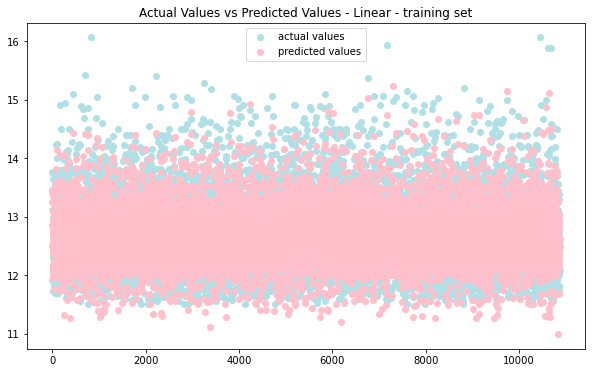

In [32]:
#plot betwwen prediction vs actual - train:
plt.figure(figsize=(10,6))
plt.scatter(range(len(y_train)), y_train, color='powderblue', label = "actual values")
plt.scatter(range(len(LR.predict(X_train))), LR.predict(X_train), color='pink', label = "predicted values")
plt.title("Actual Values vs Predicted Values - Linear - training set")
plt.legend()

In [33]:
#MAE & R2 - Linear - val set:
print("mae:", mean_absolute_error(y_val, LR.predict(X_val)))
print("mse:", mean_squared_error(y_val, LR.predict(X_val)))
print("rmse:", mean_squared_error(y_val, LR.predict(X_val), squared = False))
print("r2:", r2_score(y_val, LR.predict(X_val)))

mae: 0.3083396895115652
mse: 0.15185499117957948
rmse: 0.38968575952885354
r2: 0.5666785546678896


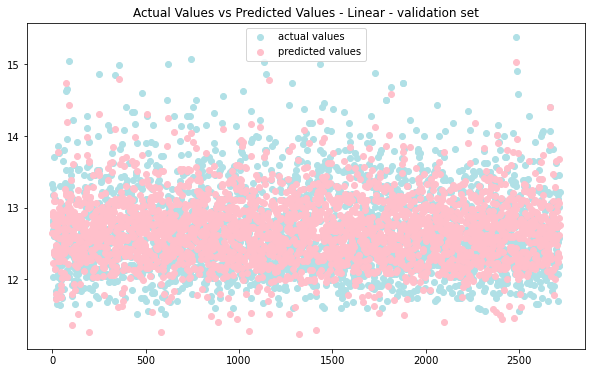

In [34]:
#plot betwwen prediction vs actual - val:
plt.figure(figsize=(10,6))
plt.scatter(range(len(y_val)), y_val, color='powderblue', label = "actual values")
plt.scatter(range(len(LR.predict(X_val))), LR.predict(X_val), color='pink', label = "predicted values")
plt.title("Actual Values vs Predicted Values - Linear - validation set")
plt.legend()

In [35]:
#MAE & R2 - Linear - test set:
print("mae:", mean_absolute_error(y_test, LR.predict(X_test)))
print("mse:", mean_squared_error(y_test, LR.predict(X_test)))
print("rmse:", mean_squared_error(y_test, LR.predict(X_test), squared = False))
print("r2:", r2_score(y_test, LR.predict(X_test)))

mae: 0.30415326054796943
mse: 0.14713361272382353
rmse: 0.3835799952080707
r2: 0.5974229949769482


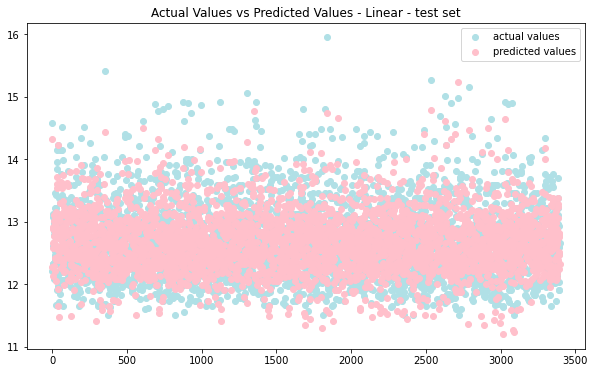

In [36]:
#plot betwwen prediction vs actual:
plt.figure(figsize=(10,6))
plt.scatter(range(len(y_test)), y_test, color='powderblue', label = "actual values")
plt.scatter(range(len(LR_pred)), LR_pred, color='pink', label = "predicted values")
plt.title("Actual Values vs Predicted Values - Linear - test set")
plt.legend()

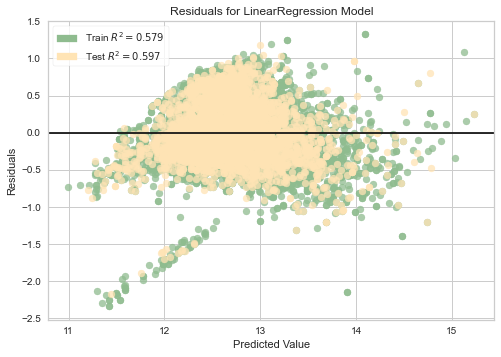

<AxesSubplot:title={'center':'Residuals for LinearRegression Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [186]:
#Residual plot - test:
import yellowbrick
from yellowbrick.regressor import ResidualsPlot
model = LinearRegression() #change this by Linear or knn
visualizer = ResidualsPlot(model, hist = False, train_color='darkseagreen', test_color='moccasin')

visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
visualizer.show()  

##USing Lime to analize:

In [38]:
features = final.columns

In [39]:
X_train_lime = X_train.to_numpy()
X_test_lime = X_test.to_numpy()

In [40]:
explainer = lime_tabular.LimeTabularExplainer(X_train_lime, mode="regression", feature_names= features)
explainer

In [41]:
#idx = random.randint(1, len(X_test_lime))

print("Prediction : ", LR_pred[0].reshape(1,-1))
print("Actual :     ", y_test.iloc[0])

explanation_1 = explainer.explain_instance(X_test.iloc[0], LR.predict, num_features=len(features))
explanation_1

Prediction :  [[14.32520851]]
Actual :      14.580978865220017


In [42]:
explanation_1.show_in_notebook()

In [43]:
print("Prediction : ", LR_pred[25].reshape(1,-1))
print("Actual :     ", y_test.iloc[25])

explanation_2 = explainer.explain_instance(X_test.iloc[25], LR.predict, num_features=len(features))
explanation_2

Prediction :  [[12.93143313]]
Actual :      13.215855541983634


In [44]:
explanation_2.show_in_notebook()

In [176]:
alphas = np.logspace(-5, 1, 60)
enet = linear_model.ElasticNet(l1_ratio=0.7, max_iter=10000)
train_errors = list()
test_errors = list()
for alpha in alphas:
    enet.set_params(alpha=alpha)
    enet.fit(X_train, y_train)
    train_errors.append(enet.score(X_train, y_train))
    test_errors.append(enet.score(X_test, y_test))

i_alpha_optim = np.argmax(test_errors)
alpha_optim = alphas[i_alpha_optim]
print("Optimal regularization parameter : %s" % alpha_optim)

# Estimate the coef_ on full data with optimal regularization parameter
enet.set_params(alpha=alpha_optim)
coef_ = enet.fit(X, y).coef_

Optimal regularization parameter : 1e-05


Text(0, 0.5, 'Performance')

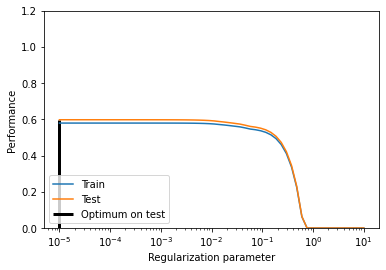

In [177]:
plt.semilogx(alphas, train_errors, label="Train")
plt.semilogx(alphas, test_errors, label="Test")
plt.vlines(
    alpha_optim,
    plt.ylim()[0],
    np.max(test_errors),
    color="k",
    linewidth=3,
    label="Optimum on test",
)
plt.legend(loc="lower left")
plt.ylim([0, 1.2])
plt.xlabel("Regularization parameter")
plt.ylabel("Performance")

## KNN Part:

In [45]:
#Grid search for KNN:
knn = KNeighborsRegressor()
parameters = {"n_neighbors" :[5, 10], 
              "weights": ["uniform", "distance"],
              "algorithm": ["auto", "kd_tree"],
               "p":[1,2,3]}
grid_knn = GridSearchCV(estimator = knn, param_grid = parameters, cv = 10, verbose = 1, n_jobs = -1)
Grid = grid_knn.fit(X_train, y_train)
Grid.best_params_

Fitting 10 folds for each of 24 candidates, totalling 240 fits


{'algorithm': 'auto', 'n_neighbors': 10, 'p': 3, 'weights': 'distance'}

In [46]:
#KNN
knn = KNeighborsRegressor(n_neighbors = 10, weights = "distance", algorithm='auto', p=2)
knn.fit(X_train,y_train)

KNeighborsRegressor(n_neighbors=10, weights='distance')

In [47]:
#MAE & R2 - KNN - trainset:
print("mae:", mean_absolute_error(y_train, knn.predict(X_train)))
print("mse:", mean_squared_error(y_train, knn.predict(X_train)))
print("rmse:", mean_squared_error(y_train, knn.predict(X_train), squared = False))
print("r2:", r2_score(y_train, knn.predict(X_train)))

mae: 0.005585607174633583
mse: 0.001347103817431825
rmse: 0.03670291292842879
r2: 0.9963799972436421


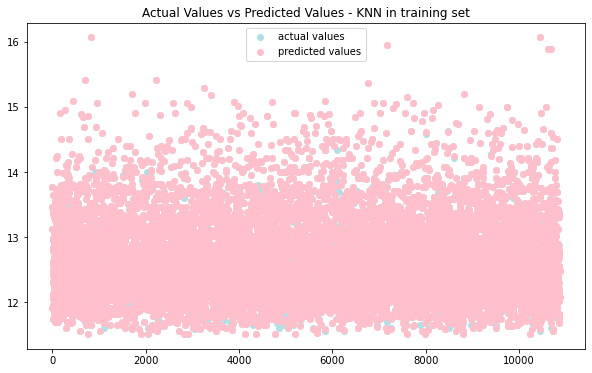

In [48]:
#plot betwwen prediction vs actual:
plt.figure(figsize=(10,6))
plt.scatter(range(len(y_train)), y_train, color='powderblue', label = "actual values")
plt.scatter(range(len(knn.predict(X_train))), knn.predict(X_train), color='pink', label = "predicted values")
plt.title("Actual Values vs Predicted Values - KNN in training set")
plt.legend()

In [49]:
#MAE & R2 - KNN - valset:
print("mae:", mean_absolute_error(y_val, knn.predict(X_val)))
print("mse:", mean_squared_error(y_val, knn.predict(X_val)))
print("rmse:", mean_squared_error(y_val, knn.predict(X_val), squared = False))
print("r2:", r2_score(y_val, knn.predict(X_val)))

mae: 0.10138474888292397
mse: 0.033988831950773284
rmse: 0.18436060303322205
r2: 0.9030121455234733


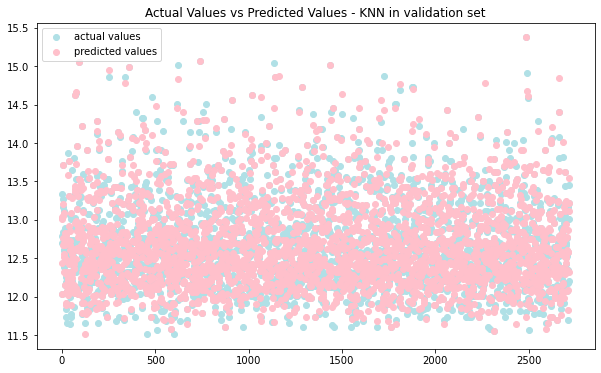

In [50]:
#plot betwwen prediction vs actual:
plt.figure(figsize=(10,6))
plt.scatter(range(len(y_val)), y_val, color='powderblue', label = "actual values")
plt.scatter(range(len(knn.predict(X_val))), knn.predict(X_val), color='pink', label = "predicted values")
plt.title("Actual Values vs Predicted Values - KNN in validation set")
plt.legend()

In [51]:
#MAE & R2 - KNN - test set:
print("mae:", mean_absolute_error(y_test, knn.predict(X_test)))
print("mse:", mean_squared_error(y_test, knn.predict(X_test)))
print("rmse:", mean_squared_error(y_test, knn.predict(X_test), squared = False))
print("r2:", r2_score(y_test, knn.predict(X_test)))

mae: 0.09996615351787277
mse: 0.03205774787920135
rmse: 0.17904677567384827
r2: 0.9122857660457399


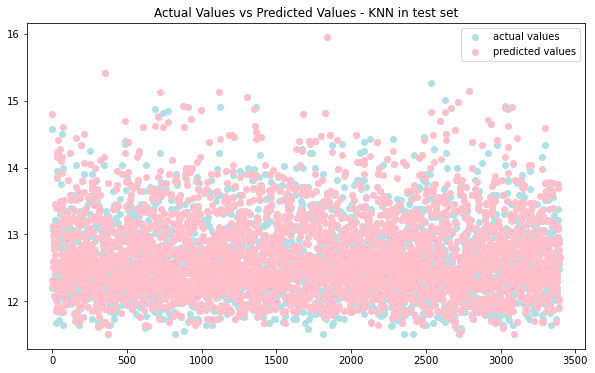

In [52]:
#plot betwwen prediction vs actual:
plt.figure(figsize=(10,6))
plt.scatter(range(len(y_test)), y_test, color='powderblue', label = "actual values")
plt.scatter(range(len(knn.predict(X_test))), knn.predict(X_test), color='pink', label = "predicted values")
plt.title("Actual Values vs Predicted Values - KNN in test set")
plt.legend()

In [53]:
print("Prediction : ", knn.predict(X_test)[0].reshape(1,-1))
print("Actual :     ", y_test.iloc[0])

explanation_knn_1= explainer.explain_instance(X_test.iloc[0], knn.predict, num_features=len(features))
explanation_knn_1

Prediction :  [[14.79355475]]
Actual :      14.580978865220017


In [54]:
explanation_knn_1.show_in_notebook()

In [76]:
print("Prediction : ", knn.predict(X_test)[25].reshape(1,-1))
print("Actual :     ", y_test.iloc[25])

explanation_knn_2= explainer.explain_instance(X_test.iloc[25], knn.predict, num_features=len(features))
explanation_knn_2

Prediction :  [[13.06218811]]
Actual :      13.215855541983634


In [77]:
explanation_knn_2.show_in_notebook()

In [78]:
print("Prediction : ", knn.predict(X_test)[50].reshape(1,-1))
print("Actual :     ", y_test.iloc[50])

explanation_knn_3= explainer.explain_instance(X_test.iloc[50], knn.predict, num_features=len(features))
explanation_knn_3

Prediction :  [[11.89101345]]
Actual :      12.07254696717504


In [79]:
explanation_knn_3.show_in_notebook()

In [82]:
print("Prediction : ", knn.predict(X_test)[75].reshape(1,-1))
print("Actual :     ", y_test.iloc[75])

explanation_knn_4= explainer.explain_instance(X_test.iloc[75], knn.predict, num_features=len(features))
explanation_knn_4

Prediction :  [[13.27936884]]
Actual :      13.279368835614243


In [83]:
explanation_knn_4.show_in_notebook()

In [ ]:
#Error rate plot with k - number:
error_rate = []
# Might take some time
for i in range(1,10):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    pred_i = knn.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))
    
plt.figure(figsize=(10,6))
plt.plot(range(1,10),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

## SVM part:

In [212]:
from sklearn.svm import SVR
svr_poly = SVR(kernel="poly", C=100, gamma="auto", degree=3, epsilon=0.1, coef0=1)
svr_poly.fit(X_train, y_train)

SVR(C=100, coef0=1, gamma='auto', kernel='poly')

In [213]:
#MAE & R2 - KNN - train set:
print("mae:", mean_absolute_error(y_train, svr_poly.predict(X_train)))
print("mse:", mean_squared_error(y_train, svr_poly.predict(X_train)))
print("rmse:", mean_squared_error(y_train, svr_poly.predict(X_train), squared = False))
print("r2:", r2_score(y_train, svr_poly.predict(X_train)))

mae: 0.17533558651489545
mse: 0.0698350547489197
rmse: 0.2642632300357348
r2: 0.8123358516172507


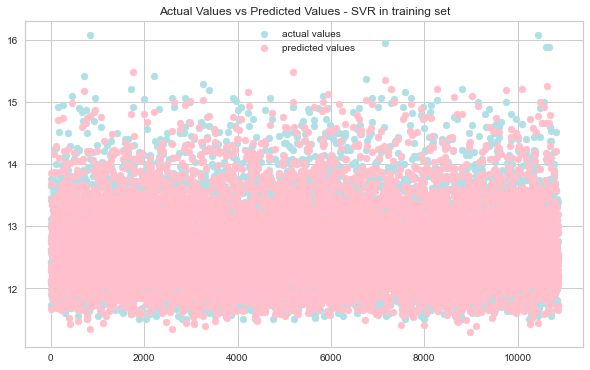

In [214]:
#plot betwwen prediction vs actual - train:
plt.figure(figsize=(10,6))
plt.scatter(range(len(y_train)), y_train, color='powderblue', label = "actual values")
plt.scatter(range(len(svr_poly.predict(X_train))), svr_poly.predict(X_train), color='pink', label = "predicted values")
plt.title("Actual Values vs Predicted Values - SVR in training set")
plt.legend()

In [215]:
#MAE & R2 - KNN - val set:
print("mae:", mean_absolute_error(y_val, svr_poly.predict(X_val)))
print("mse:", mean_squared_error(y_val, svr_poly.predict(X_val)))
print("rmse:", mean_squared_error(y_val, svr_poly.predict(X_val), squared = False))
print("r2:", r2_score(y_val, svr_poly.predict(X_val)))

mae: 0.17767834674373792
mse: 0.06900360625416845
rmse: 0.26268537502908007
r2: 0.803096742735151


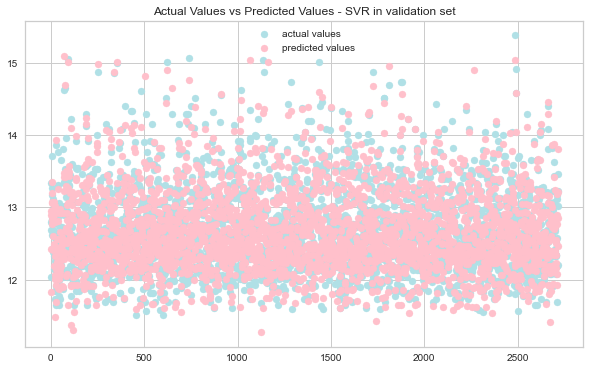

In [216]:
#plot betwwen prediction vs actual - val:
plt.figure(figsize=(10,6))
plt.scatter(range(len(y_val)), y_val, color='powderblue', label = "actual values")
plt.scatter(range(len(svr_poly.predict(X_val))), svr_poly.predict(X_val), color='pink', label = "predicted values")
plt.title("Actual Values vs Predicted Values - SVR in validation set")
plt.legend()

In [217]:
#MAE & R2 - KNN - test set:
print("mae:", mean_absolute_error(y_test, svr_poly.predict(X_test)))
print("mse:", mean_squared_error(y_test, svr_poly.predict(X_test)))
print("rmse:", mean_squared_error(y_test, svr_poly.predict(X_test), squared = False))
print("r2:", r2_score(y_test, svr_poly.predict(X_test)))

mae: 0.1760112223458241
mse: 0.06288839402589733
rmse: 0.2507755849876485
r2: 0.8279290445672853


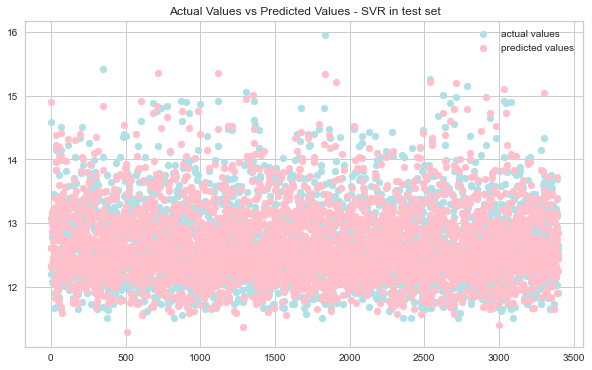

In [218]:
#plot betwwen prediction vs actual:
plt.figure(figsize=(10,6))
plt.scatter(range(len(y_test)), y_test, color='powderblue', label = "actual values")
plt.scatter(range(len(svr_poly.predict(X_test))), svr_poly.predict(X_test), color='pink', label = "predicted values")
plt.title("Actual Values vs Predicted Values - SVR in test set")
plt.legend()

In [39]:
from sklearn.svm import SVR
svr = SVR(kernel="linear", C=100, gamma="auto", degree=3, epsilon=0.2, coef0=1)
svr.fit(X_train, y_train)

SVR(C=100, coef0=1, epsilon=0.2, gamma='auto', kernel='linear')

In [40]:
#MAE & R2 - KNN - test set:
print("mae:", mean_absolute_error(y_val, svr.predict(X_val)))
print("mse:", mean_squared_error(y_val, svr.predict(X_val)))
print("rmse:", mean_squared_error(y_val, svr.predict(X_val), squared = False))
print("r2:", r2_score(y_val, svr.predict(X_val)))

mae: 0.30494160971744116
mse: 0.15291634830782344
rmse: 0.3910451998271088
r2: 0.5636499495410399


## MLP Part:

In [72]:
model = Sequential()
model.add(Dense(4, input_dim=6, activation='relu'))
model.add(Dense(1, activation='linear'))

optimizer = Adam(lr=0.01, beta_1=0.9, beta_2=0.999, epsilon=1e-8)
model.compile(loss='mean_absolute_error', optimizer=optimizer, metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=20, batch_size=1, verbose=2, validation_data=(X_val, y_val))


Epoch 1/20


C:\Users\TL\Anaconda\lib\site-packages\keras\optimizer_v2\adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


10867/10867 - 11s - loss: 0.6101 - accuracy: 0.0000e+00 - val_loss: 0.4349 - val_accuracy: 0.0000e+00 - 11s/epoch - 1ms/step
Epoch 2/20
10867/10867 - 11s - loss: 0.3119 - accuracy: 0.0000e+00 - val_loss: 0.2693 - val_accuracy: 0.0000e+00 - 11s/epoch - 1ms/step
Epoch 3/20
10867/10867 - 11s - loss: 0.3061 - accuracy: 0.0000e+00 - val_loss: 0.2692 - val_accuracy: 0.0000e+00 - 11s/epoch - 998us/step
Epoch 4/20
10867/10867 - 11s - loss: 0.3034 - accuracy: 0.0000e+00 - val_loss: 0.2603 - val_accuracy: 0.0000e+00 - 11s/epoch - 985us/step
Epoch 5/20
10867/10867 - 12s - loss: 0.3028 - accuracy: 0.0000e+00 - val_loss: 0.2979 - val_accuracy: 0.0000e+00 - 12s/epoch - 1ms/step
Epoch 6/20
10867/10867 - 15s - loss: 0.2978 - accuracy: 0.0000e+00 - val_loss: 0.2783 - val_accuracy: 0.0000e+00 - 15s/epoch - 1ms/step
Epoch 7/20
10867/10867 - 11s - loss: 0.2985 - accuracy: 0.0000e+00 - val_loss: 0.2713 - val_accuracy: 0.0000e+00 - 11s/epoch - 1ms/step
Epoch 8/20
10867/10867 - 12s - loss: 0.2954 - accuracy:

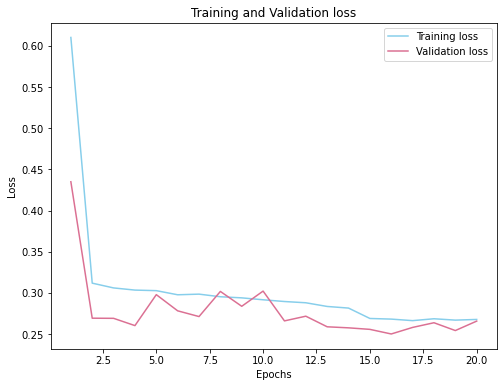

In [73]:
#Loss plot train - val:
plt.figure(figsize=(8,6))
loss_train = history.history['loss']
loss_val = history.history['val_loss']
epochs = range(1,len(loss_train)+1)
plt.plot(epochs, loss_train, 'skyblue', label='Training loss')
plt.plot(epochs, loss_val, 'palevioletred', label='Validation loss')
plt.title('Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [59]:
y_pred_train = model.predict(X_train)
y_pred_val = model.predict(X_val)
y_pred_test = model.predict(X_test)

In [60]:
#MAE & R2 - MLP - training set:
print("mae:", mean_absolute_error(y_train, y_pred_train))
print("mse:", mean_squared_error(y_train, y_pred_train))
print("rmse:", mean_squared_error(y_train, y_pred_train, squared = False))
print("r2:", r2_score(y_train, y_pred_train))

mae: 0.21801918676870094
mse: 0.10136352087289312
rmse: 0.31837638240436916
r2: 0.7276110272973936


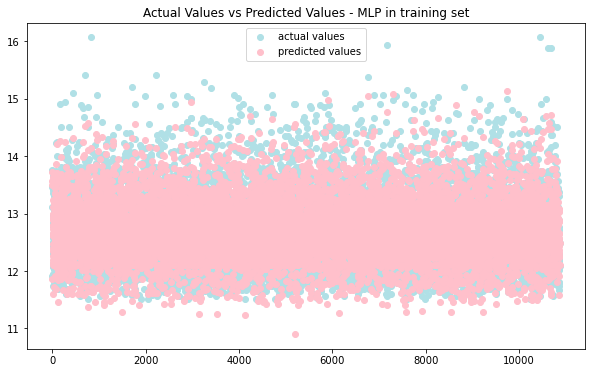

In [61]:
#plot betwwen prediction vs actual - train:
plt.figure(figsize=(10,6))
plt.scatter(range(len(y_train)), y_train, color='powderblue', label = "actual values")
plt.scatter(range(len(y_pred_train)), y_pred_train, color='pink', label = "predicted values")
plt.title("Actual Values vs Predicted Values - MLP in training set")
plt.legend()

In [62]:
#MAE & R2 - MLP - val set:
print("mae:", mean_absolute_error(y_val, y_pred_val))
print("mse:", mean_squared_error(y_val, y_pred_val))
print("rmse:", mean_squared_error(y_val, y_pred_val, squared = False))
print("r2:", r2_score(y_val, y_pred_val))

mae: 0.2144760034694446
mse: 0.09624620875844445
rmse: 0.3102357309505861
r2: 0.7253593973896758


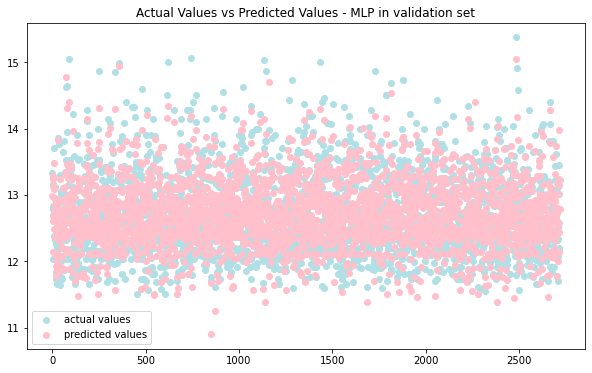

In [63]:
#plot betwwen prediction vs actual - val:
plt.figure(figsize=(10,6))
plt.scatter(range(len(y_val)), y_val, color='powderblue', label = "actual values")
plt.scatter(range(len(y_pred_val)), y_pred_val, color='pink', label = "predicted values")
plt.title("Actual Values vs Predicted Values - MLP in validation set")
plt.legend()

In [64]:
#MAE & R2 - MLP - test set:
print("mae:", mean_absolute_error(y_test, y_pred_test))
print("mse:", mean_squared_error(y_test, y_pred_test))
print("rmse:", mean_squared_error(y_test, y_pred_test, squared = False))
print("r2:", r2_score(y_test, y_pred_test))

mae: 0.21615645349710425
mse: 0.09155145103472202
rmse: 0.3025747032299991
r2: 0.749503133371337


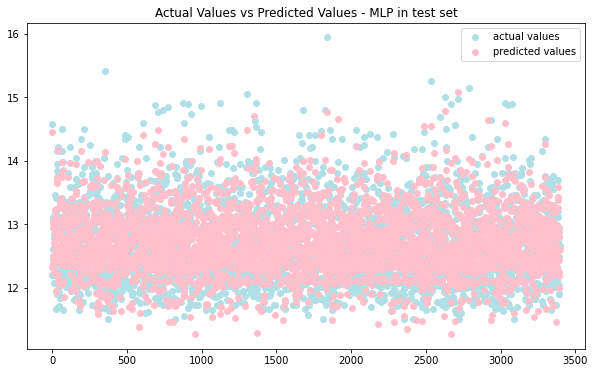

In [66]:
#plot betwwen prediction vs actual:
plt.figure(figsize=(10,6))
plt.scatter(range(len(y_test)), y_test, color='powderblue', label = "actual values")
plt.scatter(range(len(y_pred_test)), y_pred_test, color='pink', label = "predicted values")
plt.title("Actual Values vs Predicted Values - MLP in test set")
plt.legend()

In [67]:
model1 = Sequential()
model1.add(Dense(4, input_dim=6, activation='relu'))
model1.add(Dense(1, activation='linear'))

optimizer = Adam(lr=0.01, beta_1=0.9, beta_2=0.999, epsilon=1e-8)
model1.compile(loss='mean_absolute_error', optimizer=optimizer, metrics=['accuracy'])

history1 = model1.fit(X_train, y_train, epochs=20, batch_size=1, verbose=2, validation_data=(X_test, y_test))

Epoch 1/20


C:\Users\TL\Anaconda\lib\site-packages\keras\optimizer_v2\adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


10867/10867 - 11s - loss: 0.4972 - accuracy: 0.0000e+00 - val_loss: 0.2996 - val_accuracy: 0.0000e+00 - 11s/epoch - 999us/step
Epoch 2/20
10867/10867 - 11s - loss: 0.3045 - accuracy: 0.0000e+00 - val_loss: 0.2536 - val_accuracy: 0.0000e+00 - 11s/epoch - 968us/step
Epoch 3/20
10867/10867 - 11s - loss: 0.2947 - accuracy: 0.0000e+00 - val_loss: 0.2262 - val_accuracy: 0.0000e+00 - 11s/epoch - 968us/step
Epoch 4/20
10867/10867 - 10s - loss: 0.2885 - accuracy: 0.0000e+00 - val_loss: 0.2312 - val_accuracy: 0.0000e+00 - 10s/epoch - 962us/step
Epoch 5/20
10867/10867 - 11s - loss: 0.2709 - accuracy: 0.0000e+00 - val_loss: 0.2511 - val_accuracy: 0.0000e+00 - 11s/epoch - 968us/step
Epoch 6/20
10867/10867 - 10s - loss: 0.2469 - accuracy: 0.0000e+00 - val_loss: 0.2829 - val_accuracy: 0.0000e+00 - 10s/epoch - 964us/step
Epoch 7/20
10867/10867 - 11s - loss: 0.2390 - accuracy: 0.0000e+00 - val_loss: 0.2536 - val_accuracy: 0.0000e+00 - 11s/epoch - 972us/step
Epoch 8/20
10867/10867 - 11s - loss: 0.2379 -

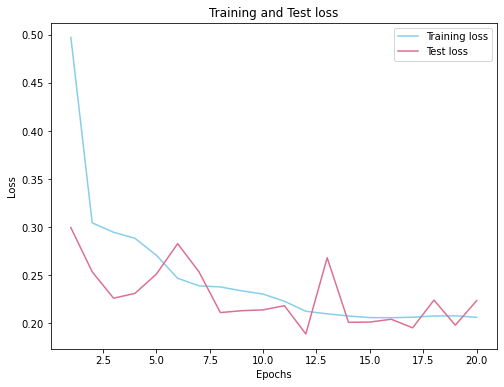

In [68]:
#Loss plot train - test:
plt.figure(figsize=(8,6))
loss_train = history1.history['loss']
loss_val = history1.history['val_loss']
epochs = range(1,21)
plt.plot(epochs, loss_train, 'skyblue', label='Training loss')
plt.plot(epochs, loss_val, 'palevioletred', label='Test loss')
plt.title('Training and Test loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [28]:
# model = Sequential()
# model.add(Dense(4, input_dim=6, activation='relu'))
# model.add(Dense(1, activation='linear'))

# optimizer = Adam(lr=0.01, beta_1=0.9, beta_2=0.999, epsilon=1e-8)
# model.compile(loss='mean_absolute_error', optimizer=optimizer)

# model.fit(X_train, y_train, epochs=20, batch_size=1, verbose=2)

In [70]:
# y_pred = model.predict(X_test)

In [71]:
# import tensorflow.keras.losses
# mae = tensorflow.keras.losses.MeanAbsoluteError()
# mae(y_test, y_pred).numpy()

0.6125333

In [72]:
# #MAE & R2 - MLP - test set:
# print("mae:", mean_absolute_error(y_test, y_pred))
# print("mse:", mean_squared_error(y_test, y_pred))
# print("rmse:", mean_squared_error(y_test, y_pred, squared = False))
# print("r2:", r2_score(y_test, y_pred))

mae: 0.22893803025414133
mse: 0.12110359262536924
rmse: 0.34799941469113027
r2: 0.6686445692857045


In [128]:
df.head()

,year_built,area,price,bedrooms,postal_code,rooms,address,property_type
0,1984,31,132500,1,1065LX,1,Jan Muschstraat 8,1
1,1990,79,300000,1,1019HT,2,Zeeburgerkade 738 +PP,1
2,1906,93,550000,3,1051GT,4,Cliffordstraat 22 -HUIS,1
3,2002,90,318500,2,1095LG,3,Zeeburgerdijk 768,1
4,1904,142,475000,3,1035PS,6,Landsmeerderdijk 47,0


Text(0, 0.5, 'area')

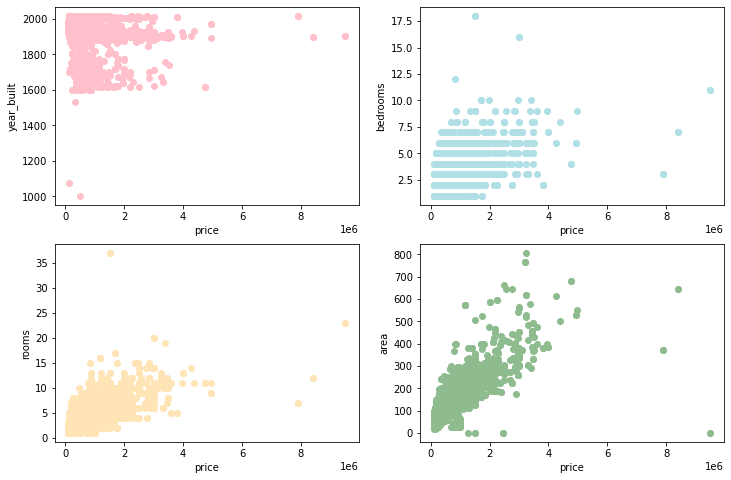

In [133]:
plt.figure(figsize=(12,8))
ax1 = plt.subplot(2, 2, 1) 
ax1.scatter(df["price"], df["year_built"], c="pink")
ax1.set_xlabel('price')
ax1.set_ylabel('year_built')

ax2 = plt.subplot(2, 2, 2)
ax2.scatter(df["price"], df["bedrooms"], c = "powderblue")
ax2.set_xlabel('price')
ax2.set_ylabel('bedrooms')

ax3 = plt.subplot(2, 2, 3) 
ax3.scatter(df["price"], df["rooms"], c = "moccasin")
ax3.set_xlabel('price')
ax3.set_ylabel('rooms')


ax4 = plt.subplot(2, 2, 4)
ax4.scatter(df["price"], df["area"], c = "darkseagreen")
ax4.set_xlabel('price')
ax4.set_ylabel('area')

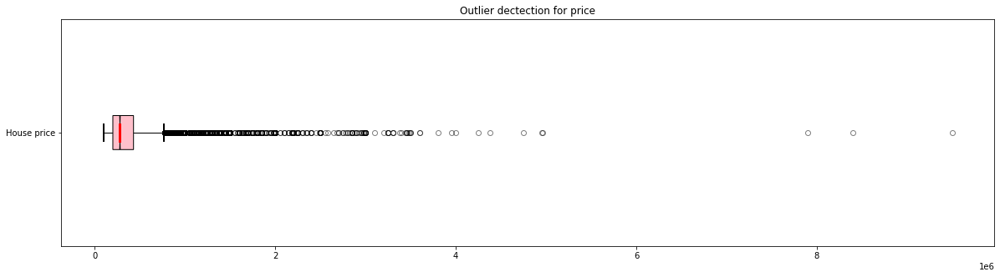

In [48]:
#data_1 = final["price"]
data = final["price"]

fig = plt.figure(figsize =(20, 5))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True,
                notch ='True', vert = 0)
 
color = 'pink'
 
for patch in (bp['boxes']):
    patch.set_facecolor(color)
# changing color and linewidth of
# caps
for cap in bp['caps']:
    cap.set(color ='black',
            linewidth = 2)
 
#changing color and linewidth of
# medians
for median in bp['medians']:
    median.set(color ='red',
               linewidth = 3)
 
# changing style of fliers
for flier in bp['fliers']:
    flier.set(marker ='o',
              color ='b',
              alpha = 0.5)
    
# x-axis labels
ax.set_yticklabels(['House price'])
 
# Adding title
plt.title("Outlier dectection for price")
 
# Removing top axes and right axes
# ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()